Take a look at the [repository](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix) for more information

In [0]:
!ls ./checkpoints



ls: cannot access './checkpoints': No such file or directory


# Install

In [0]:
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2194, done.
remote: Total 2194 (delta 0), reused 0 (delta 0), pack-reused 2194
Receiving objects: 100% (2194/2194), 8.01 MiB | 29.19 MiB/s, done.
Resolving deltas: 100% (1423/1423), done.


In [0]:
import os
os.chdir('pytorch-CycleGAN-and-pix2pix/')

In [0]:
from google.colab import drive
drive.mount('/content/gdrive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
os.listdir(os.getcwd()+"/checkpoints/doodle2ukiyoe")
os.listdir(os.getcwd()+"/models")

['template_model.py',
 '__init__.py',
 'cycle_gan_model.py',
 'networks.py',
 'colorization_model.py',
 'test_model.py',
 'base_model.py',
 '__pycache__',
 'pix2pix_model.py']

In [0]:
!pip install -r requirements.txt

     |████████████████████████████████| 686kB 6.9MB/s 
     |████████████████████████████████| 204kB 23.7MB/s 
  Created wheel for visdom: filename=visdom-0.1.8.9-cp36-none-any.whl size=655252 sha256=0e87ccf7de4aa2c80b190097f0a6aa91fb674d724e9909247edb6168ea681546
  Stored in directory: /root/.cache/pip/wheels/70/19/a7/6d589ed967f4dfefd33bc166d081257bd4ed0cb618dccfd62a
  Created wheel for torchfile: filename=torchfile-0.1.0-cp36-none-any.whl size=5711 sha256=7a6b7483bd07413d30cc8de4827a979ca00398358a0d1a60fe43f3666b736637
  Stored in directory: /root/.cache/pip/wheels/b1/c3/d6/9a1cc8f3a99a0fc1124cae20153f36af59a6e683daca0a0814
Successfully built visdom torchfile


# Datasets

Download one of the official datasets with:

-   `bash ./datasets/download_cyclegan_dataset.sh [apple2orange, orange2apple, summer2winter_yosemite, winter2summer_yosemite, horse2zebra, zebra2horse, monet2photo, style_monet, style_cezanne, style_ukiyoe, style_vangogh, sat2map, map2sat, cityscapes_photo2label, cityscapes_label2photo, facades_photo2label, facades_label2photo, iphone2dslr_flower]`

Or use your own dataset by creating the appropriate folders and adding in the images.

-   Create a dataset folder under `/dataset` for your dataset.
-   Create subfolders `testA`, `testB`, `trainA`, and `trainB` under your dataset's folder. Place any images you want to transform from a to b (cat2dog) in the `testA` folder, images you want to transform from b to a (dog2cat) in the `testB` folder, and do the same for the `trainA` and `trainB` folders.

In [0]:
!bash ./datasets/download_cyclegan_dataset.sh ukiyoe2photo

Specified [ukiyoe2photo]
for details.

--2020-01-16 11:35:26--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/ukiyoe2photo.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.189.73
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.189.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 292946532 (279M) [application/zip]
Saving to: ‘./datasets/ukiyoe2photo.zip’

./datasets/ukiyoe2p 100%[===================>] 279.38M  96.8MB/s    in 2.9s    

2020-01-16 11:35:29 (96.8 MB/s) - ‘./datasets/ukiyoe2photo.zip’ saved [292946532/292946532]

Archive:  ./datasets/ukiyoe2photo.zip
   creating: ./datasets/ukiyoe2photo/trainA/
  inflating: ./datasets/ukiyoe2photo/trainA/01159.jpg  
  inflating: ./datasets/ukiyoe2photo/trainA/01144.jpg  
  inflating: ./datasets/ukiyoe2photo/trainA/00883.jpg  
  inflating: ./datasets/ukiyoe2photo/trainA/00985.jpg  
  inflating: ./datasets/ukiyoe2photo/trainA/00311.jpg  
  infla

# Pretrained models

Download one of the official pretrained models with:

-   `bash ./scripts/download_cyclegan_model.sh [apple2orange, orange2apple, summer2winter_yosemite, winter2summer_yosemite, horse2zebra, zebra2horse, monet2photo, style_monet, style_cezanne, style_ukiyoe, style_vangogh, sat2map, map2sat, cityscapes_photo2label, cityscapes_label2photo, facades_photo2label, facades_label2photo, iphone2dslr_flower]`

Or add your own pretrained model to `./checkpoints/{NAME}_pretrained/latest_net_G.pt`

In [0]:
!bash ./scripts/download_cyclegan_model.sh style_ukiyoe

Note: available models are apple2orange, orange2apple, summer2winter_yosemite, winter2summer_yosemite, horse2zebra, zebra2horse, monet2photo, style_monet, style_cezanne, style_ukiyoe, style_vangogh, sat2map, map2sat, cityscapes_photo2label, cityscapes_label2photo, facades_photo2label, facades_label2photo, iphone2dslr_flower
Specified [style_ukiyoe]
for details.

--2020-01-16 11:35:43--  http://efrosgans.eecs.berkeley.edu/cyclegan/pretrained_models/style_ukiyoe.pth
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.189.73
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.189.73|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 45575747 (43M)
Saving to: ‘./checkpoints/style_ukiyoe_pretrained/latest_net_G.pth’

./checkpoints/style 100%[===================>]  43.46M  64.2MB/s    in 0.7s    

2020-01-16 11:35:44 (64.2 MB/s) - ‘./checkpoints/style_ukiyoe_pretrained/latest_net_G.pth’ saved [45575747/45575747]



# Training

-   `python train.py --dataroot ./datasets/horse2zebra --name horse2zebra --model cycle_gan`

Change the `--dataroot` and `--name` to your own dataset's path and model's name. Use `--gpu_ids 0,1,..` to train on multiple GPUs and `--batch_size` to change the batch size. I've found that a batch size of 16 fits onto 4 V100s and can finish training an epoch in ~90s.

Once your model has trained, copy over the last checkpoint to a format that the testing model can automatically detect:

Use `cp ./checkpoints/horse2zebra/latest_net_G_A.pth ./checkpoints/horse2zebra/latest_net_G.pth` if you want to transform images from class A to class B and `cp ./checkpoints/horse2zebra/latest_net_G_B.pth ./checkpoints/horse2zebra/latest_net_G.pth` if you want to transform images from class B to class A.


In [0]:
!python train.py  --dataroot ../gdrive/My\ Drive/Deep_Learning/Cycle_train --name cycle_doodle2ukiyoe --model cycle_gan --continue --epoch_count 180
!mkdir -p ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/cycle_doodle2ukiyoe/results/test8 && cp -r ./checkpoints/cycle_doodle2ukiyoe/ ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/cycle_doodle2ukiyoe/results/test8

----------------- Options ---------------
               batch_size: 1                             
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: True                          	[default: False]
                crop_size: 256                           
                 dataroot: ../gdrive/My Drive/Deep_Learning/Cycle_train	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
              display_env: main                          
             display_freq: 400                           
               display_id: 1                             
            display_ncols: 4                             
             display_port: 8097                          
           display_server: http://localhost              
          display_winsize: 256                           
                    epoch: latest        

In [0]:
!cp -r ./checkpoints/cycle_doodle2ukiyoe/ ../gdrive/My\ Drive/Deep_Learning/results/CycleGan

In [0]:

!cp -r ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/cycle_doodle2ukiyoe/ ./checkpoints/cycle_doodle2ukiyoe/ 

^C


In [0]:
!ls ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/Latest
!cp -r ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/Latest/ ./checkpoints/cycle_doodle2ukiyoe
!mv ./checkpoints/cycle_doodle2ukiyoe/Latest/* ./checkpoints/cycle_doodle2ukiyoe/

!ls ./checkpoints/cycle_doodle2ukiyoe/

latest_net_D_A.pth  latest_net_G_A.pth	latest_net_G_D.pth
latest_net_D_B.pth  latest_net_G_B.pth	latest_net_G.pth
Latest		    latest_net_D_B.pth	latest_net_G_B.pth  latest_net_G.pth
latest_net_D_A.pth  latest_net_G_A.pth	latest_net_G_D.pth  train_opt.txt


./checkpoints/cycle_doodle2ukiyoe/

In [0]:

!cp ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/cycle_doodle2ukiyoe/results/test4/cycle_doodle2ukiyoe/latest_net_G_A.pth ./checkpoints/cycle_doodle2ukiyoe/latest_net_G_A.pth
!cp ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/cycle_doodle2ukiyoe/results/test4/cycle_doodle2ukiyoe/latest_net_G_B.pth ./checkpoints/cycle_doodle2ukiyoe/latest_net_G_B.pth

!cp ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/cycle_doodle2ukiyoe/results/test4/cycle_doodle2ukiyoe/latest_net_D_A.pth ./checkpoints/cycle_doodle2ukiyoe/latest_net_D_A.pth
!cp ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/cycle_doodle2ukiyoe/results/test4/cycle_doodle2ukiyoe/latest_net_D_B.pth ./checkpoints/cycle_doodle2ukiyoe/latest_net_D_B.pth

cp: cannot create regular file './checkpoints/cycle_doodle2ukiyoe/latest_net_G_A.pth': No such file or directory
cp: cannot create regular file './checkpoints/cycle_doodle2ukiyoe/latest_net_G_B.pth': No such file or directory
cp: cannot create regular file './checkpoints/cycle_doodle2ukiyoe/latest_net_D_A.pth': No such file or directory
cp: cannot create regular file './checkpoints/cycle_doodle2ukiyoe/latest_net_D_B.pth': No such file or directory


In [0]:
!ls ../gdrive/My\ Drive/Deep_Learning/results/CycleGan/cycle_doodle2ukiyoe/

100_net_D_A.pth  25_net_G_B.pth  55_net_G_A.pth  80_net_D_B.pth
100_net_D_B.pth  30_net_D_A.pth  55_net_G_B.pth  80_net_G_A.pth
100_net_G_A.pth  30_net_D_B.pth  5_net_D_A.pth	 80_net_G_B.pth
100_net_G_B.pth  30_net_G_A.pth  5_net_D_B.pth	 85_net_D_A.pth
105_net_D_A.pth  30_net_G_B.pth  5_net_G_A.pth	 85_net_D_B.pth
105_net_D_B.pth  35_net_D_A.pth  5_net_G_B.pth	 85_net_G_A.pth
105_net_G_A.pth  35_net_D_B.pth  60_net_D_A.pth  85_net_G_B.pth
105_net_G_B.pth  35_net_G_A.pth  60_net_D_B.pth  90_net_D_A.pth
10_net_D_A.pth	 35_net_G_B.pth  60_net_G_A.pth  90_net_D_B.pth
10_net_D_B.pth	 40_net_D_A.pth  60_net_G_B.pth  90_net_G_A.pth
10_net_G_A.pth	 40_net_D_B.pth  65_net_D_A.pth  90_net_G_B.pth
10_net_G_B.pth	 40_net_G_A.pth  65_net_D_B.pth  95_net_D_A.pth
15_net_D_A.pth	 40_net_G_B.pth  65_net_G_A.pth  95_net_D_B.pth
15_net_D_B.pth	 45_net_D_A.pth  65_net_G_B.pth  95_net_G_A.pth
15_net_G_A.pth	 45_net_D_B.pth  70_net_D_A.pth  95_net_G_B.pth
15_net_G_B.pth	 45_net_G_A.pth  70_net_D_B.pth  lat

# Testing

-   `python test.py --dataroot datasets/horse2zebra/testA --name horse2zebra_pretrained --model test --no_dropout`

Change the `--dataroot` and `--name` to be consistent with your trained model's configuration.

> from https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix:
> The option --model test is used for generating results of CycleGAN only for one side. This option will automatically set --dataset_mode single, which only loads the images from one set. On the contrary, using --model cycle_gan requires loading and generating results in both directions, which is sometimes unnecessary. The results will be saved at ./results/. Use --results_dir {directory_path_to_save_result} to specify the results directory.

> For your own experiments, you might want to specify --netG, --norm, --no_dropout to match the generator architecture of the trained model.

In [0]:
!python test.py --dataroot ../gdrive/My\ Drive/Deep_Learning/Cycle_train --name cycle_doodle2ukiyoe --model test --no_dropout

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 1                             
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: ../gdrive/My Drive/Deep_Learning/Cycle_train	[default: None]
             dataset_mode: single                        
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                  gpu_ids: 0                             
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0              

In [0]:

!cp ./checkpoints/cycle_doodle2ukiyoe/latest_net_G_A.pth ./checkpoints/cycle_doodle2ukiyoe/latest_net_G.pth

In [0]:
!cp ./checkpoints/cycle_doodle2ukiyoe/latest_net_G_B.pth ./checkpoints/cycle_doodle2ukiyoe/latest_net_G.pth 

In [0]:
!rm -r ./results

# Visualize

['bird404_real_A.png', 'bird439_real_B.png', 'bird422_fake_B.png', 'bird426_real_A.png', 'bird427_real_A.png', 'bird418_rec_B.png', 'bird442_real_A.png', 'bird434_rec_A.png', 'bird430_rec_B.png', 'bird436_rec_A.png', 'bird412_rec_B.png', 'bird409_real_A.png', 'bird425_real_B.png', 'bird437_real_B.png', 'bird430_real_A.png', 'bird429_fake_A.png', 'bird405_fake_A.png', 'bird413_fake_B.png', 'bird407_rec_A.png', 'bird444_rec_B.png', 'bird449_fake_A.png', 'bird432_real_A.png', 'bird427_real_B.png', 'bird415_real_A.png', 'bird424_rec_B.png', 'bird435_real_A.png', 'bird437_real_A.png', 'bird414_real_B.png', 'bird416_real_A.png', 'bird420_rec_A.png', 'bird409_fake_A.png', 'bird446_rec_B.png', 'bird428_rec_B.png', 'bird407_fake_A.png', 'bird412_real_B.png', 'bird443_fake_B.png', 'bird449_real_B.png', 'bird439_real_A.png', 'bird424_fake_B.png', 'bird439_rec_A.png', 'bird408_rec_B.png', 'bird432_rec_A.png', 'bird446_real_B.png', 'bird400_rec_B.png', 'bird447_rec_A.png', 'bird441_real_B.png', 'bi

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


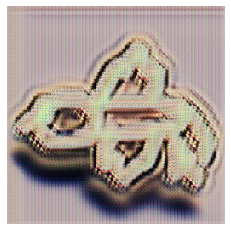

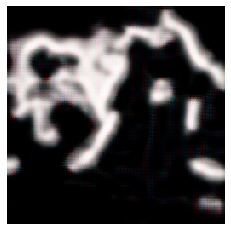

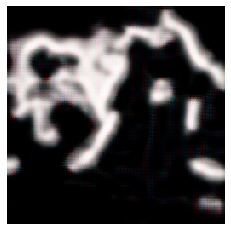

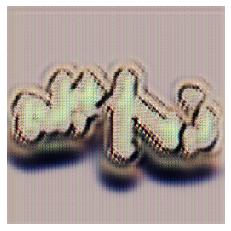

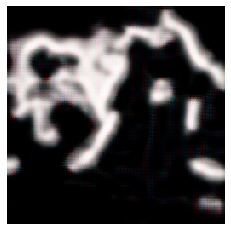

...

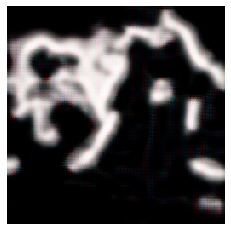

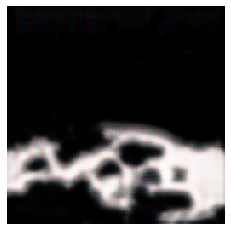

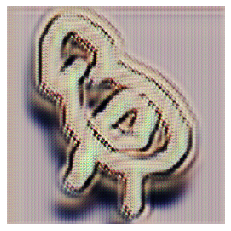

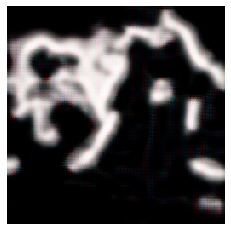

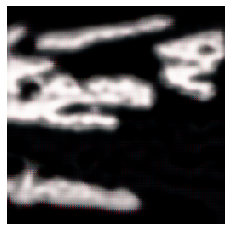

In [0]:
import matplotlib.pyplot as plt
path = './results/doodle2ukiyoe/test_latest/images/'
i=0
print(os.listdir(path))
for num, image in enumerate(os.listdir(path)):
  if 'fake' in (image):
    plt.figure()
    plt.clf()
    img = plt.imread(path+image)
    plt.axis('off')
    plt.imshow(img)

img = plt.imread(path+'bird426_fake_A.png')
plt.imshow(img)

In [0]:
import matplotlib.pyplot as plt

img = plt.imread('./results/style_ukiyoe_pretrained_pretrained/test_latest/images/n02381460_1010_real.png')
plt.imshow(img)

FileNotFoundError: ignored